__Summary of Results__<br>

Analysis<br>
* Most of items are bought few returned, and for most items only a single item is bought <br>
* Items from Food and Pharmacy and Beauty Department are most frequently bought <br>
* Grocery Dry Goods is the most "visited" department from the Food category <br>
* People are mostl likely to buy during Friday to Sunday
* Most Common Commodity is banana
* Department,Weekday vary by TripType

Feature Engineering <br>
* Return: If an item is returned
* Count_of_Item: how many items have we bought
* COMMODITY: or all PLU items (4 to 5 digits), added COMMODITY TYPE (banana, apple)
* Rename_Dep: Aggregate departments


In [1]:
import pandas as pd
#import tensorflow as ts
import numpy as np
import pickle
import sys
sys.path.append(r'UTILS')
import Utils
from Utils import add_nan,add_check_digit,matcher,reformat,digit_first,open_pickle,write_pickle
from bokeh.plotting import figure
from bokeh.io import show, output_notebook
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

# Variable Description

| Variable | Description |Type
| --- | --- | --- |
| Visit Number | When they visited |Original Data|
| --- | --- | --- |
| Weekday | Day when the visit occured|Original Data|
| --- | --- | --- |
| Upc | Code printed on retail products|Original Data|
| --- | --- | --- |
| ScanCount | Items Scanned or Returned|Original Data|
| --- | --- | --- |
| DepartmentDescription | Name of department (granular)|Original Data|
| --- | --- | --- |
| Rename_Dep | Name of department (aggregated)|Engineered
| --- | --- | --- |
| Return | If items was returned or bought|Engineered
| --- | --- | --- |
| Count_of_item | Number of items bought - single or multiple|Engineered
| --- | --- | --- |
| COMMODITY | PLU item name|Engineered

# 1. Import Files

In [2]:
#remove scientific notication for UPC
pd.set_option('display.float_format', '{:.2f}'.format)

__Note:__ created a file that manually aggregated departments (for example, Grocery DSD and Grocery was put into one category called Food)

In [3]:
#a pickle file to get the department renaming and the column transformations
dep_rename = open_pickle(r'DATA/dep_rename.pickle')
cols_agg = open_pickle(r'DATA/col_agg.pickle')

In [4]:
#read file
wal = pd.read_csv(r'DATA/train.csv',error_bad_lines = False)

# 2. Preprocessing and Feature Engineering

In [5]:
#replace nan with 999
wal['Upc'] = wal['Upc'].apply(Utils.add_nan)

In [6]:
#convert UPC to float and then to integer
wal['Upc'] = wal['Upc'].apply(lambda x: int(float(x)))

In [7]:
#replace nan with 999
wal['FinelineNumber'] = wal['FinelineNumber'].apply(Utils.add_nan)

In [8]:
#convert FinelineNumber to float and then to integer
wal['FinelineNumber'] = wal['FinelineNumber'].apply(lambda x: int(float(x)))

## 2b. Adding PLU categories

__Note:__ Some of the UPC numbers are actually __PRICE Lookup Codes__ 4 or 5 digit number assigned to certain grocery items (apples or banans).

In [9]:
plu = pd.read_csv(r'DATA/PLU.csv',error_bad_lines = False)[['PLU','COMMODITY']]

In [10]:
wal_plu = wal.merge(plu, left_on = 'Upc', right_on = 'PLU', how = 'left')

## 2c. Defining Returned items or items where person has bought multiple items

In [11]:
wal_plu['Return'] = wal_plu['ScanCount'].apply(lambda x: 'Returned' if x < 0 else 'Bought')
#get if the item bought is more than one
wal_plu['Count_of_Item'] = wal_plu['ScanCount'].apply(lambda x: 'Multiple' if x > 1 or x< -1 else 'Single')

In [12]:
wal_plu['Rename_Dep'] = wal_plu['DepartmentDescription'].map(dep_rename)

In [13]:
wal_plu['count'] = 1

In [14]:
wal_plu.head()

,TripType,VisitNumber,Weekday,Upc,ScanCount,DepartmentDescription,FinelineNumber,PLU,COMMODITY,Return,Count_of_Item,Rename_Dep,count
0,999,5,Friday,68113152929,-1,FINANCIAL SERVICES,1000,nan,NaN,Returned,Single,Financial Services,1
1,30,7,Friday,60538815980,1,SHOES,8931,nan,NaN,Bought,Single,"Clothing,Shoes,and Accessories",1
2,30,7,Friday,7410811099,1,PERSONAL CARE,4504,nan,NaN,Bought,Single,"Pharmacy,Health,and Beauty",1
3,26,8,Friday,2238403510,2,PAINT AND ACCESSORIES,3565,nan,NaN,Bought,Multiple,Home Improvement and Patio,1
4,26,8,Friday,2006613744,2,PAINT AND ACCESSORIES,1017,nan,NaN,Bought,Multiple,Home Improvement and Patio,1


# 3. Exploratory Analysis

In [15]:
sns.set(style="white", palette = 'PiYG', color_codes=True, font_scale = 5)

In [16]:
main_co = wal_plu.TripType.unique().tolist()

## 3.1 Trip Type by Return

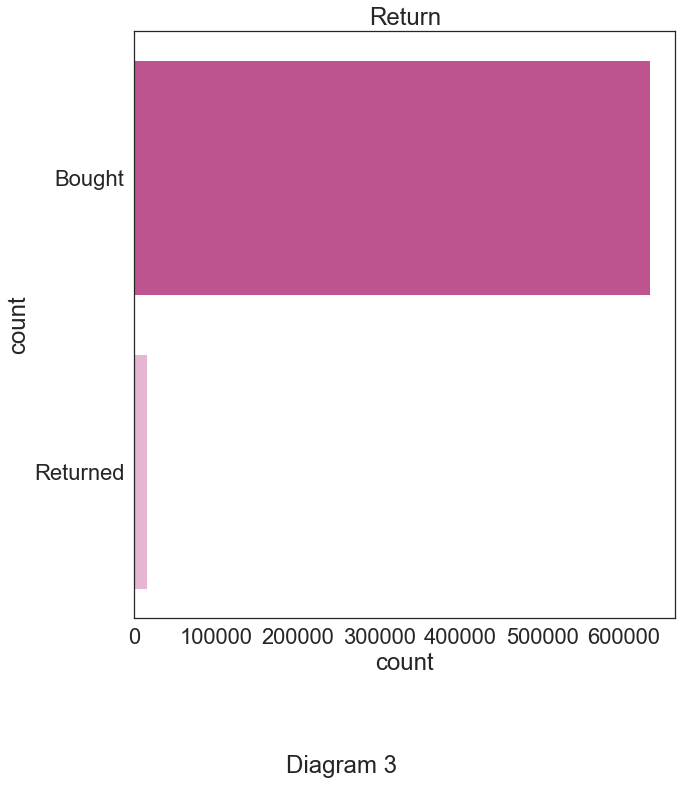

In [46]:
Utils.single_barplot((10,10),'count','Return',
               wal_plu.groupby(['Return']).agg({'count':'sum'}).reset_index().sort_values(by = 'count',
               ascending = False),"Diagram 3", 'Return')
plt.show()

__Observation #1:__ Most items are bought and relatively view are returned

## 3.2 Trip Type by Number of Items Bought

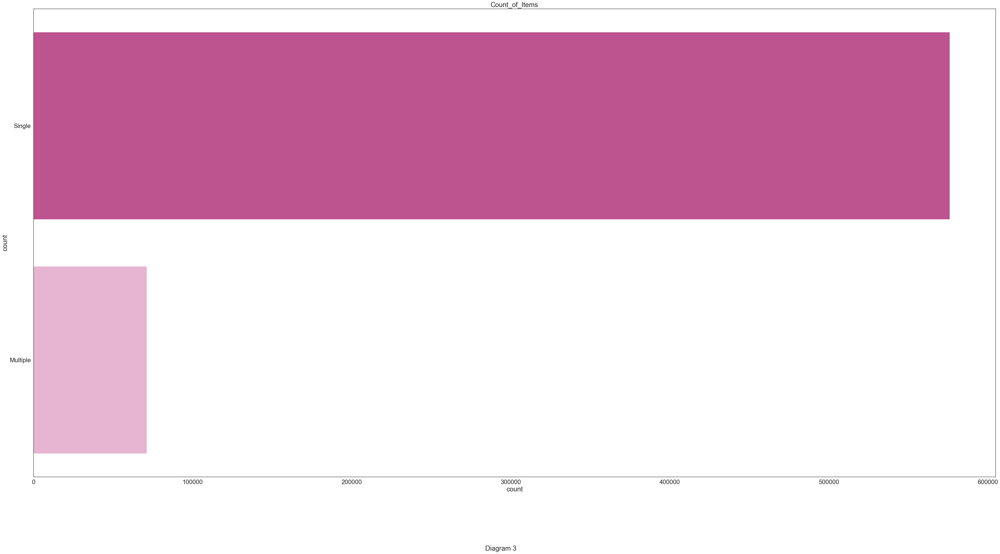

In [38]:
Utils.single_barplot((50,25),'count','Count_of_Item',
               wal_plu.groupby(['Count_of_Item']).agg({'count':'sum'}).reset_index().sort_values(by = 'count',
               ascending = False),"Diagram 3", 'Count_of_Items')
plt.show()

__Observation #2:__ It seems like most items people buy are single items.

## 3.3 Department Description 

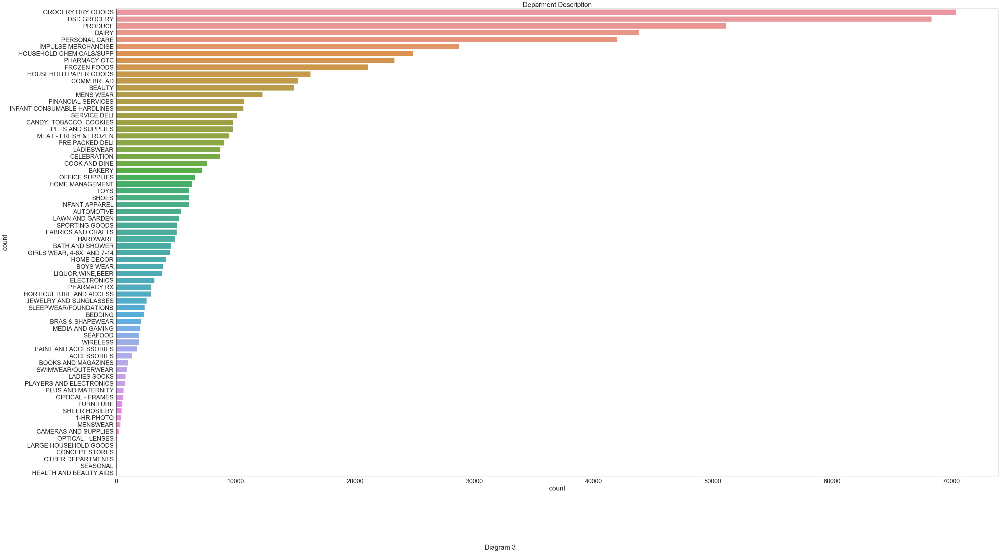

In [19]:
Utils.single_barplot((50,25),'count','DepartmentDescription',
               wal_plu.groupby(['DepartmentDescription']).agg({'count':'sum'}).reset_index().sort_values(by = 'count',
               ascending = False),"Diagram 3", 'Deparment Description')
plt.show()

__Observation 3:__ Most of the items are from Grocery Related Department and Personal Care

## 3.4 Trip Type by Department(Renamed)

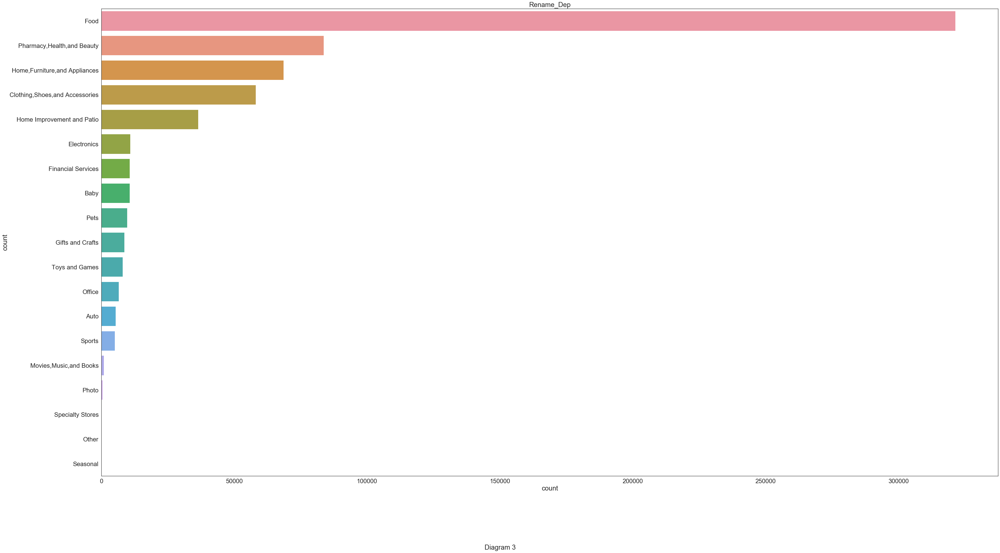

In [35]:
Utils.single_barplot((50,25),'count','Rename_Dep',
               wal_plu.groupby(['Rename_Dep']).agg({'count':'sum'}).reset_index().sort_values(by = 'count',
               ascending = False),"Diagram 3", 'Rename_Dep')
plt.show()

In [20]:

Utils.create_norm_subplot_cat(wal_plu,sorted(main_co),'TripType','Rename_Dep',(70,400),'count')

__Observation 4:__ In the first diagram we saw that the food department has most "visits". This indicates that department (renamed) tend to vary by trip type. For example, Trip Type 6,7,8,12,15,37,39,40, 43, and 44 tend to have Food as the most frequent category. Similarly, Pharmacy and Beauty were very frequent in trip type 4,5, and 36.

## 3.5 Trip Type by Department (Granular)

In [21]:
Utils.create_norm_subplot_cat(wal_plu,sorted(main_co),'TripType','DepartmentDescription',(70,400),'count')

__Observation 5__: If we look into the Pharmacy and Beauty Category, we can see that trip type 4 and 5 are more related to Pharamcy while trip type 36 is related to personal care. For the Food Category, 6 is related to Liquor, 7 to deli and 8 to DSD Category. So this indicates that for different trips, customers tend to buy different things.

## 3.6 Weekday

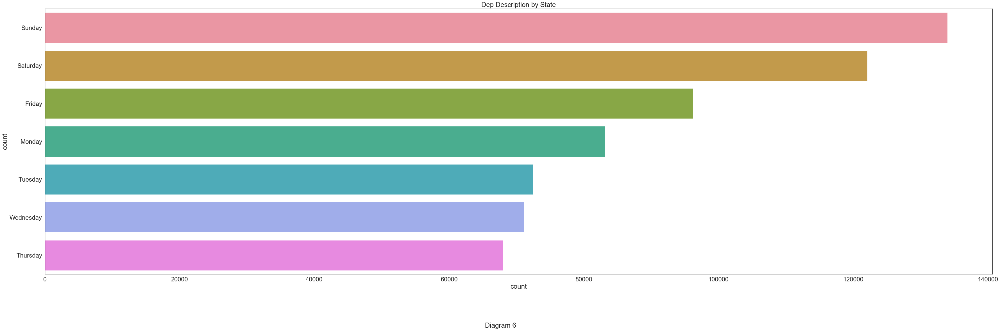

In [22]:
Utils.single_barplot((50,15),'count','Weekday',
               wal_plu.groupby(['Weekday']).agg({'count': 'sum'}).reset_index().sort_values(by = 'count',ascending = False),
               "Diagram 6", 'Dep Description by State')
plt.show()

__Observation 6:__ The plot indicates that most purchases happen on Sunday and Saturday given that they are weekends so people are more likely to want to purchase. 

In [23]:
Utils.create_norm_subplot_cat(wal_plu,sorted(main_co),'TripType','Weekday',(70,400),'count')

__Observation 7__:As we see, across different trip types, people are more likely to shope on different days. Saturday and Sunday are most common, but, for example, in trip type 3 and 18, Friday is the most frequent day, people come.

# 3.7 Trip Type by Fresh Produce

For the PLU codes that we have matched, we will look at the distribution across Trip Types

In [24]:
main_co_plu = wal_plu[~wal_plu['COMMODITY'].isnull()].TripType.unique().tolist()

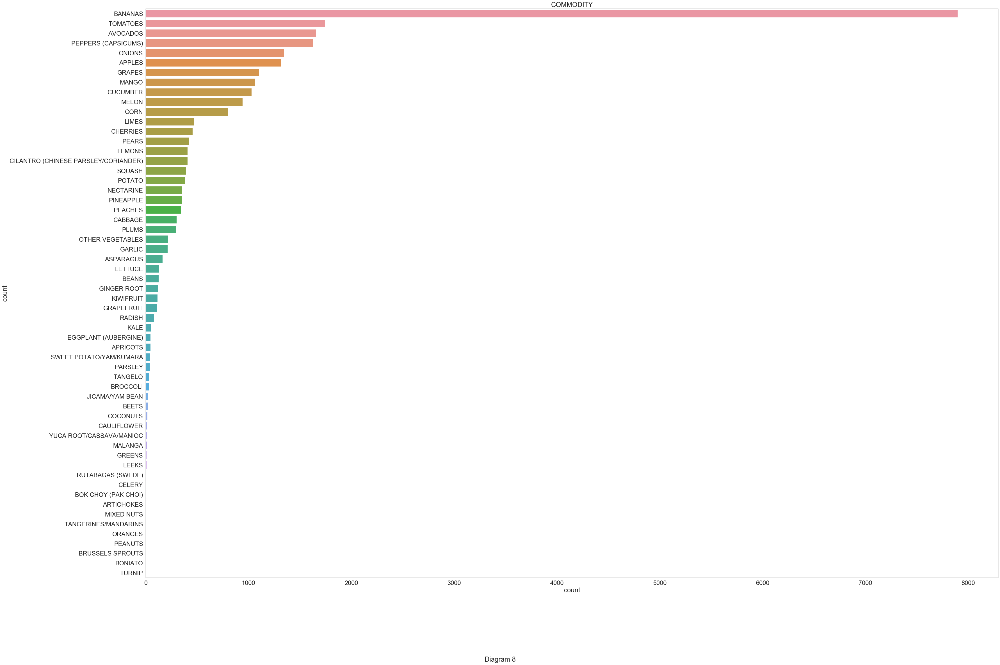

In [34]:
Utils.single_barplot((50,30),'count','COMMODITY',
               wal_plu[~wal_plu['COMMODITY'].isnull()].groupby(['COMMODITY']).agg({'count': 'sum'}).reset_index().sort_values(by = 'count',ascending = False),
               "Diagram 8", 'COMMODITY')
plt.show()

__Observation 8:__ It seems bananas and tomatoes are the most common Fresh Produce.

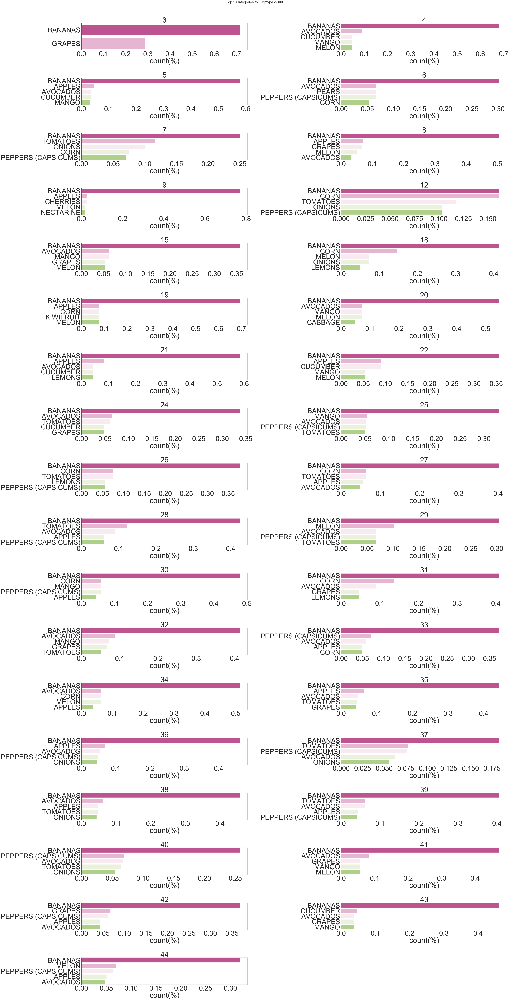

In [26]:
Utils.create_norm_subplot_cat(wal_plu[~wal_plu['COMMODITY'].isnull()],sorted(main_co_plu),
                              'TripType','COMMODITY',(70,300),'count')

__Observation 9:__ It seem that bananas are popular across all Trip Types. But, we see differences across the second and third most common choices. 

# 4.0 Statistical Analysis

For this data set we will perform, chi-square to compare whether there is statistical significant difference between categorical frequencies.

In [28]:
def chi_df(ls, dataframe, var):
    
    """
    @ls: list of unique combinations between 2 categorical variables
    @dataframe: the datframe
    @var: variable
    """
    from scipy.stats import chisquare
    sns.set(style="white", palette = 'PiYG', color_codes=True,font_scale = 1)
    data_l = []
    
    for i in ls:
        #for every row in the list
        #calculate counts of every group of variables 
        var1 = dataframe[dataframe[var] == i[0]].groupby(var).size().reset_index()
        var2 = dataframe[dataframe[var] == i[1]].groupby(var).size().reset_index()
        
        #calcualte #chi
        chisq,p = chisquare([var1[0],var2[0]])
        #convert to dataframe
        data = pd.DataFrame({'var1': i[0], 'var2': i[1],'p': p, 'chi': chisq})
        data_l.append(data)
    
    data_c = pd.concat(data_l)
    
    #convert to pivot table with var1 as row and var 2 as columns
    data_p = data_c.pivot_table(index = 'var1',columns = 'var2',values = 'p')
    #create heatmap
    """
    as we are performing numerous tests, we need to ensure we adjust for the family wise error. Thus, we will determine significance
    by calculating the bonferroni correction: 0.05/number of tests
    """
    bonf_corr = 0.05/len(data_c)
    
    #plot to sns
    ax = sns.heatmap(data_p, fmt="", cmap='PiYG',cbar_kws={'ticks': [0.0,bonf_corr]}, vmin=0, vmax=0.5, linewidths=.2)
    return ax
    
    
    

## 4.1 Stats Analysis Against Department Rename

In [29]:
ls = list(combinations(wal_plu.Rename_Dep.dropna().unique(),2))

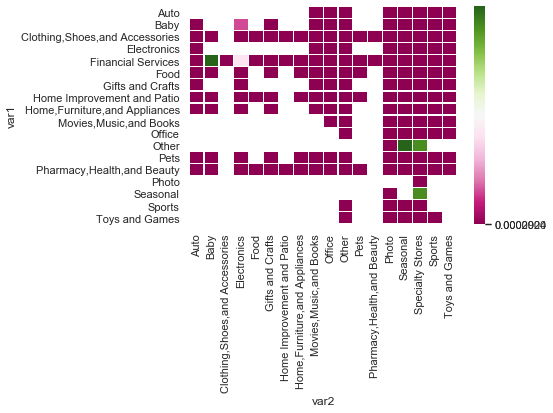

In [30]:
chi_df(ls,wal_plu,'Rename_Dep')

__Observation #1:__It seems like number of products bought from Financial Services is significantly different compared to number of products bought from most other departments with exception of products from Baby and Electronics.Similarly, number of items bought Specialty Stores department is significantly different than most other departments with exception of Seasonal and Other

## 4.2 Stats Analysis: Weekday

In [31]:
ls_w = list(combinations(wal_plu.Weekday.dropna().unique(),2))

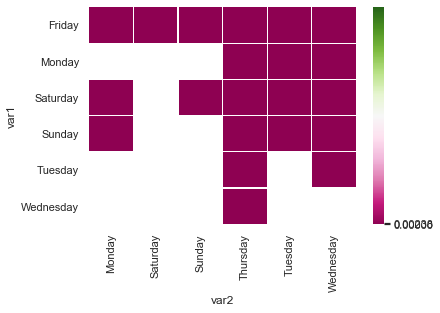

In [32]:
chi_df(ls_w,wal_plu,'Weekday')

__Observation#2__ It seems like the number of items bought or returned are significantly different from other days of the week.